In [41]:
from os import listdir
import pickle
import plotly
import pandas as pd
import plotly.graph_objects as go
import numpy as np
result_exclude_Apr28 = pd.read_csv(os.getcwd()+'\data\Keith_2020_yearly_clean.csv', index_col = 'Date and time')
result_exclude_Apr28.drop(result_exclude_Apr28.index[range(75756,76044)], axis=0, inplace=True)
result_exclude_Apr28.drop(result_exclude_Apr28.index[range(83520,83520+24*12)], axis=0, inplace=True)
result_exclude_Apr28.index = pd.to_datetime(result_exclude_Apr28.index)

In [39]:
result_exclude_Apr28

,Net Demand (Wh),Energy from grid (Wh),Energy to grid (Wh),Consumption (Wh),PV production (Wh)
Date and time,,,,,
2020-01-01 00:00:00,83.0,83.0,0.0,83.0,0.0
2020-01-01 00:05:00,89.0,89.0,0.0,89.0,0.0
2020-01-01 00:10:00,87.0,87.0,0.0,87.0,0.0
2020-01-01 00:15:00,72.0,72.0,0.0,72.0,0.0
2020-01-01 00:20:00,58.0,58.0,0.0,58.0,0.0
...,...,...,...,...,...
2021-02-28 23:35:00,0.0,0.0,0.0,0.0,0.0
2021-02-28 23:40:00,1.0,1.0,0.0,1.0,0.0
2021-02-28 23:45:00,1.0,1.0,0.0,1.0,0.0


In [43]:
result_exclude_Apr28.loc[result_exclude_Apr28['Consumption (Wh)']<0]

,Net Demand (Wh),Energy from grid (Wh),Energy to grid (Wh),Consumption (Wh),PV production (Wh)
Date and time,,,,,


In [35]:
result_exclude_Apr28[83520:83520+24*12]

,Net Demand (Wh),Energy from grid (Wh),Energy to grid (Wh),Consumption (Wh),PV production (Wh)
Date and time,,,,,
2020-10-20 00:00:00,0.0,0.0,0.0,0.0,0.0
2020-10-20 00:05:00,0.0,0.0,0.0,0.0,0.0
2020-10-20 00:10:00,1.0,1.0,0.0,1.0,0.0
2020-10-20 00:15:00,0.0,0.0,0.0,0.0,0.0
2020-10-20 00:20:00,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...
2020-10-20 23:35:00,1.0,1.0,0.0,1.0,0.0
2020-10-20 23:40:00,0.0,0.0,0.0,0.0,0.0
2020-10-20 23:45:00,1.0,1.0,0.0,1.0,0.0


In [42]:
# result_exclude_Apr28.drop(result_exclude_Apr28.index[range(75756,76044)], axis=0, inplace=True)
# result_exclude_Apr28.drop(result_exclude_Apr28.index[range(83520,83520+24*12)], axis=0, inplace=True)

In [56]:
consumption_data = result_exclude_Apr28[:-59*12*24]['Consumption (Wh)']

In [65]:
consumption_data.index = pd.to_datetime(consumption_data.index)

In [66]:
from pandas.tseries.frequencies import to_offset

result_hourly = consumption_data.resample('H').mean()
result_hourly.index = result_hourly.index+ to_offset('1h')
# result_hourly_exp = np.repeat(result_hourly.values, 12)
result_hourly = result_hourly.interpolate()
# consumption_data_hourly = result_hourly

In [69]:
fig = go.Figure()
time_data = consumption_data.index
fig.add_trace(
        go.Scatter(
            x= time_data, y=consumption_data, line_width = 0.8, opacity = 0.7, name = 'Consumption'
        )
    )
fig.add_trace(
        go.Scatter(
            x= result_hourly.index, y=result_hourly.values, line_width = 1.8, opacity = 0.7, name = 'Hourly resampling'
        )
    )
fig.layout.xaxis.title = "Time"
fig.layout.yaxis.title = "Consumption (Wh/5mins)" 
fig.layout.plot_bgcolor='rgba(0,0,0,0)'
fig.layout.font.family="Times New Roman" ## "Times New Roman Black"
fig.layout.font.size = 20
fig.layout.width = 1000
fig.layout.height = 500
fig.update_xaxes(showline=True, linewidth=1, linecolor='black', mirror=True,showgrid=False)
##, tickangle = 45 
fig.update_yaxes(showline=True, linewidth=1, linecolor='black', mirror=True, showgrid=False)
fig.show()

In [73]:
import scipy
from scipy import signal
# fn = 1/(60*60)
# (f, S) = scipy.signal.periodogram(result_hourly, fn, scaling='density')
fs = 1/(60*5)
fn = 1/(60*60)
fig = go.Figure()
# for measurements in recovered_dict.keys():
#     (f, S) = scipy.signal.periodogram(recovered_dict[measurements], fs, scaling='density')
#     # (f, S) = scipy.signal.welch(recovered_dict[measurements], fs, scaling='density', nperseg=12*24)
#     fig.add_trace(go.Scatter(mode = 'lines', x=f, 
#     y=S, name= measurements, line_color = color_dict[measurements]))
(f, S) = scipy.signal.periodogram(consumption_data, fs, scaling='density')
# (f, S) = scipy.signal.welch(consumption_data, fs, scaling='density', nperseg=12*24)
fig.add_trace(go.Scatter(mode = 'lines', x=f, 
y=S, name= 'original', line_color = 'green')) 
(f, S) = scipy.signal.periodogram(result_hourly, fn, scaling='density')
fig.add_trace(go.Scatter(mode = 'lines', x=f, 
y=S, name= 'hourly sampled', line_color = 'purple'))    
fig.layout.font.family="Times New Roman" ## "Times New Roman Black"
fig.layout.font.size = 24
fig.layout.width = 1000
fig.layout.height = 500
fig.layout.showlegend = True
fig.layout.xaxis.title = "Frequency (Hz)"
fig.layout.yaxis.title = "PSD (Wh^2/Hz)"
# fig.layout.yaxis.tickformat = ',.0%'  
# fig.layout.xaxis.tickformat = ',.0%' 
fig.layout.plot_bgcolor='rgba(0,0,0,0)'
fig.update_xaxes(showline=True, linewidth=1, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=1, linecolor='black', mirror=True)
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
# plotly.io.write_image(fig, 'PSD_60.svg', format='svg')
fig.show()

In [75]:
fs = 1/(60*5)
fn = 1/(60*60)
fig = go.Figure()
period = 7
# (f, S) = scipy.signal.periodogram(consumption_data, fs, scaling='density')
(f, S) = scipy.signal.welch(consumption_data, fs, scaling='density', nperseg=12*24*period)
fn = 1/(60*60)
fig.add_trace(go.Scatter(mode = 'lines', x=f, 
y=S, name= 'original', line_color = 'green')) 
# (f, S) = scipy.signal.periodogram(result_hourly, fn, scaling='density')
(f, S) = scipy.signal.welch(result_hourly, fn, scaling='density', nperseg=24*period)
fig.add_trace(go.Scatter(mode = 'lines', x=f, 
y=S, name= 'hourly sampled', line_color = 'purple'))    
fig.layout.font.family="Times New Roman" ## "Times New Roman Black"
fig.layout.font.size = 24
fig.layout.width = 1000
fig.layout.height = 500
fig.layout.showlegend = True
fig.layout.xaxis.title = "Frequency (Hz)"
fig.layout.yaxis.title = "PSD (Wh^2/Hz)"
# fig.layout.yaxis.tickformat = ',.0%'  
# fig.layout.xaxis.tickformat = ',.0%' 
fig.layout.plot_bgcolor='rgba(0,0,0,0)'
fig.update_xaxes(showline=True, linewidth=1, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=1, linecolor='black', mirror=True)
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
# plotly.io.write_image(fig, 'PSD_60.svg', format='svg')
fig.show()

In [76]:
from pyentrp import entropy as ent
from sklearn.metrics import mean_absolute_error
def MAPE(y_true, y_pred): 
  ## MAPE in percentage
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / np.maximum(np.ones(len(y_true)), np.abs(y_true))))*100
def WPE(time_series, order =3):
    wpe_score = ent.weighted_permutation_entropy(time_series, order=order, normalize =True)
    return wpe_score

In [88]:
WPE(consumption_data, 6)

0.8158524576365764

In [89]:
WPE(result_hourly, 6)

0.739486206801607

In [79]:
result_wen = pd.read_csv(os.getcwd()+'\data\Wen_Soong_2021.csv', index_col = 'Date and time')
consumption_data_wen = result_wen['Consumption'][1:].astype(float)
time_data = result_wen.index[1:]
datatime_wen = pd.to_datetime(time_data, format='%d.%m.%Y %H:%M')
con_pd = {
    'Consumption' : consumption_data_wen.values,
}
con_pd_df = pd.DataFrame(con_pd, index=datatime_wen)
con_pd_df_cleanned = con_pd_df.drop(con_pd_df.index[range(79200,79476)], axis=0, inplace=False)
con_pd_df_cleanned.drop(con_pd_df_cleanned.index[range(24*12)], axis=0, inplace=True)
con_pd_df_cleanned.drop(con_pd_df_cleanned.index[range(24*12*149, 24*12*150)], axis=0, inplace=True)
consumption_data_wen = con_pd_df_cleanned['Consumption'].astype(float)

result_hourly_wen = consumption_data_wen.resample('H').mean()
result_hourly_wen.index = result_hourly_wen.index+ to_offset('1h')
# result_hourly_exp = np.repeat(result_hourly.values, 12)
result_hourly_wen = result_hourly_wen.interpolate()

In [82]:
consumption_data_wen

Date and time
2021-01-02 00:00:00     26.0
2021-01-02 00:05:00     24.0
2021-01-02 00:10:00     26.0
2021-01-02 00:15:00    117.0
2021-01-02 00:20:00     38.0
                       ...  
2021-12-31 23:35:00     34.0
2021-12-31 23:40:00    299.0
2021-12-31 23:45:00    104.0
2021-12-31 23:50:00     23.0
2021-12-31 23:55:00    303.0
Name: Consumption, Length: 104256, dtype: float64

In [86]:
WPE(consumption_data_wen, 6)

0.9265887430956006

In [87]:
WPE(result_hourly_wen, 6)

0.7474035951431102

In [83]:
min(consumption_data_wen)

0.0

In [84]:
consumption_data_wen

Date and time
2021-01-02 00:00:00     26.0
2021-01-02 00:05:00     24.0
2021-01-02 00:10:00     26.0
2021-01-02 00:15:00    117.0
2021-01-02 00:20:00     38.0
                       ...  
2021-12-31 23:35:00     34.0
2021-12-31 23:40:00    299.0
2021-12-31 23:45:00    104.0
2021-12-31 23:50:00     23.0
2021-12-31 23:55:00    303.0
Name: Consumption, Length: 104256, dtype: float64

In [90]:
fs = 1/(60*5)
fn = 1/(60*60)
fig = go.Figure()
period = 7
# (f, S) = scipy.signal.periodogram(consumption_data, fs, scaling='density')
(f, S) = scipy.signal.welch(consumption_data_wen, fs, scaling='density', nperseg=12*24*period)
fn = 1/(60*60)
fig.add_trace(go.Scatter(mode = 'lines', x=f, 
y=S, name= 'original', line_color = 'green')) 
# (f, S) = scipy.signal.periodogram(result_hourly, fn, scaling='density')
(f, S) = scipy.signal.welch(result_hourly_wen, fn, scaling='density', nperseg=24*period)
fig.add_trace(go.Scatter(mode = 'lines', x=f, 
y=S, name= 'hourly sampled', line_color = 'purple'))    
fig.layout.font.family="Times New Roman" ## "Times New Roman Black"
fig.layout.font.size = 24
fig.layout.width = 1000
fig.layout.height = 500
fig.layout.showlegend = True
fig.layout.xaxis.title = "Frequency (Hz)"
fig.layout.yaxis.title = "PSD (Wh^2/Hz)"
# fig.layout.yaxis.tickformat = ',.0%'  
# fig.layout.xaxis.tickformat = ',.0%' 
fig.layout.plot_bgcolor='rgba(0,0,0,0)'
fig.update_xaxes(showline=True, linewidth=1, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=1, linecolor='black', mirror=True)
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
# plotly.io.write_image(fig, 'PSD_60.svg', format='svg')
fig.show()

## Wavelet analysis

In [105]:
import waipy
data_norm = waipy.normalize(consumption_data_wen.values)
alpha = np.corrcoef(data_norm[0:-1], data_norm[1:])[0,1]; 
print("Lag-1 autocorrelation = {:4.2f}".format(alpha))

Lag-1 autocorrelation = 0.74


In [107]:
result = waipy.cwt(data_norm, 1, 1, 0.25, 2, 4/0.25, alpha, 6, mother='Morlet',name="Wen's data")

Nr of Scales: 62
scales [2.0, 2.378414230005442, 2.8284271247461903, 3.363585661014858, 4.0, 4.756828460010884, 5.656854249492381, 6.727171322029716, 8.0, 9.513656920021768, 11.313708498984761, 13.454342644059432, 16.0, 19.027313840043536, 22.627416997969522, 26.908685288118864, 32.0, 38.05462768008707, 45.254833995939045, 53.81737057623773, 64.0, 76.10925536017415, 90.50966799187809, 107.63474115247546, 128.0, 152.2185107203483, 181.01933598375618, 215.2694823049509, 256.0, 304.4370214406966, 362.03867196751236, 430.5389646099018, 512.0, 608.8740428813932, 724.0773439350247, 861.0779292198037, 1024.0, 1217.7480857627863, 1448.1546878700494, 1722.1558584396073, 2048.0, 2435.4961715255727, 2896.309375740099, 3444.3117168792146, 4096.0, 4870.992343051145, 5792.618751480198, 6888.623433758429, 8192.0, 9741.98468610229, 11585.237502960395, 13777.246867516858, 16384.0, 19483.96937220458, 23170.47500592079, 27554.493735033717, 32768.0, 38967.93874440916, 46340.95001184158, 55108.98747006743,

{'fig': <Figure size 4500x3000 with 5 Axes>,
 'ax_data': <AxesSubplot:title={'center':'Wen_Data'}, ylabel='Amplitude'>,
 'ax_cwt': <AxesSubplot:xlabel='Time', ylabel='Period'>,
 'ax_wavelet': <AxesSubplot:title={'center':'$\\psi$ (t/s) Morlet in time domain'}, xlabel='Time', ylabel='Amplitude'>,
 'ax_global_spectrum': <AxesSubplot:title={'center':'Global Wavelet Spectrum'}, xlabel='Power'>}

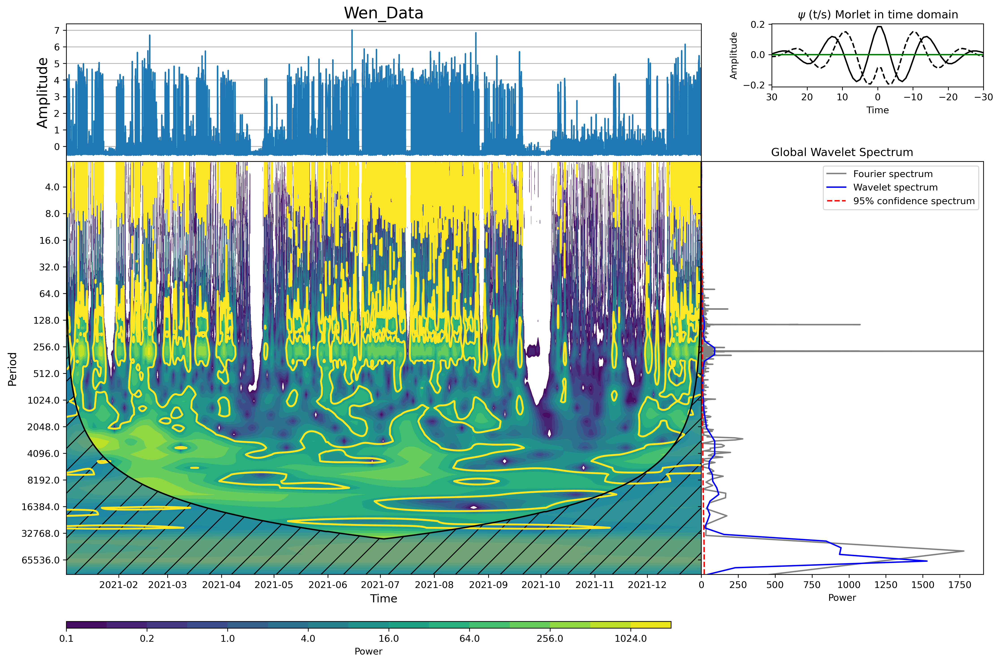

In [109]:
waipy.wavelet_plot('Wen_Data', consumption_data_wen.index, data_norm, 0.03125, result)

In [110]:
def wavelet_compute(data, fs, mother='Morlet', name='Data'):
    data_norm = waipy.normalize(data)
    alpha = np.corrcoef(data_norm[0:-1], data_norm[1:])[0,1]
    result = waipy.cwt(data_norm, 1, 1, 0.25, 2, 4/0.25, alpha, 6, mother=mother,name=name)
    waipy.wavelet_plot(name, data.index, data_norm, 0.03125, result)

Nr of Scales: 48
scales [2.0, 2.378414230005442, 2.8284271247461903, 3.363585661014858, 4.0, 4.756828460010884, 5.656854249492381, 6.727171322029716, 8.0, 9.513656920021768, 11.313708498984761, 13.454342644059432, 16.0, 19.027313840043536, 22.627416997969522, 26.908685288118864, 32.0, 38.05462768008707, 45.254833995939045, 53.81737057623773, 64.0, 76.10925536017415, 90.50966799187809, 107.63474115247546, 128.0, 152.2185107203483, 181.01933598375618, 215.2694823049509, 256.0, 304.4370214406966, 362.03867196751236, 430.5389646099018, 512.0, 608.8740428813932, 724.0773439350247, 861.0779292198037, 1024.0, 1217.7480857627863, 1448.1546878700494, 1722.1558584396073, 2048.0, 2435.4961715255727, 2896.309375740099, 3444.3117168792146, 4096.0, 4870.992343051145, 5792.618751480198, 6888.623433758429, 8192.0]


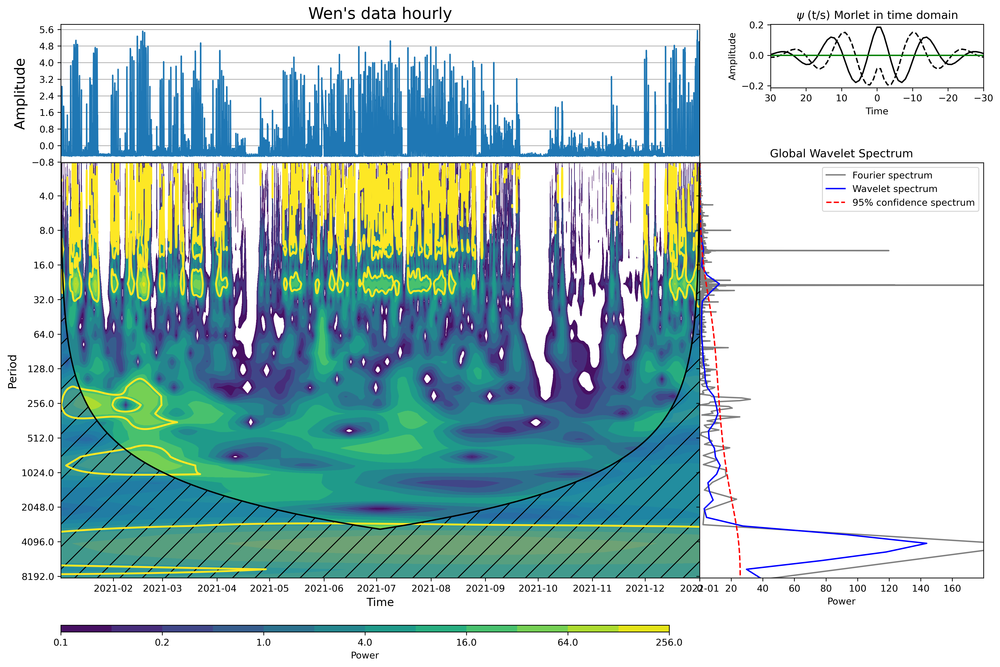

In [111]:
wavelet_compute(result_hourly_wen, 1, name="Wen's data hourly")

Nr of Scales: 62
scales [2.0, 2.378414230005442, 2.8284271247461903, 3.363585661014858, 4.0, 4.756828460010884, 5.656854249492381, 6.727171322029716, 8.0, 9.513656920021768, 11.313708498984761, 13.454342644059432, 16.0, 19.027313840043536, 22.627416997969522, 26.908685288118864, 32.0, 38.05462768008707, 45.254833995939045, 53.81737057623773, 64.0, 76.10925536017415, 90.50966799187809, 107.63474115247546, 128.0, 152.2185107203483, 181.01933598375618, 215.2694823049509, 256.0, 304.4370214406966, 362.03867196751236, 430.5389646099018, 512.0, 608.8740428813932, 724.0773439350247, 861.0779292198037, 1024.0, 1217.7480857627863, 1448.1546878700494, 1722.1558584396073, 2048.0, 2435.4961715255727, 2896.309375740099, 3444.3117168792146, 4096.0, 4870.992343051145, 5792.618751480198, 6888.623433758429, 8192.0, 9741.98468610229, 11585.237502960395, 13777.246867516858, 16384.0, 19483.96937220458, 23170.47500592079, 27554.493735033717, 32768.0, 38967.93874440916, 46340.95001184158, 55108.98747006743,

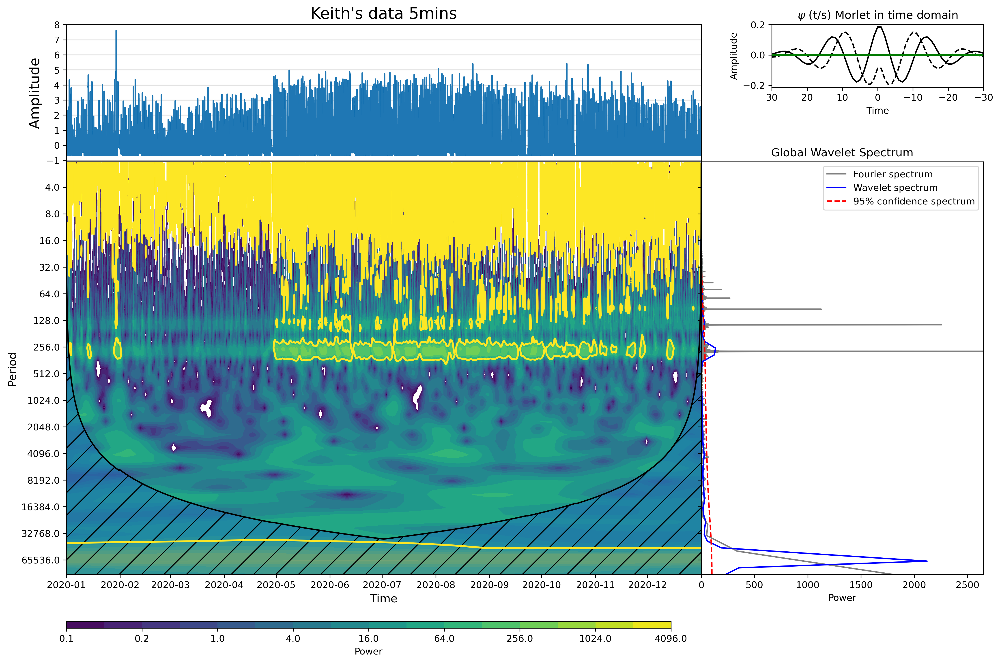

In [113]:
wavelet_compute(consumption_data, 1, name="Keith's data 5mins")

Nr of Scales: 48
scales [2.0, 2.378414230005442, 2.8284271247461903, 3.363585661014858, 4.0, 4.756828460010884, 5.656854249492381, 6.727171322029716, 8.0, 9.513656920021768, 11.313708498984761, 13.454342644059432, 16.0, 19.027313840043536, 22.627416997969522, 26.908685288118864, 32.0, 38.05462768008707, 45.254833995939045, 53.81737057623773, 64.0, 76.10925536017415, 90.50966799187809, 107.63474115247546, 128.0, 152.2185107203483, 181.01933598375618, 215.2694823049509, 256.0, 304.4370214406966, 362.03867196751236, 430.5389646099018, 512.0, 608.8740428813932, 724.0773439350247, 861.0779292198037, 1024.0, 1217.7480857627863, 1448.1546878700494, 1722.1558584396073, 2048.0, 2435.4961715255727, 2896.309375740099, 3444.3117168792146, 4096.0, 4870.992343051145, 5792.618751480198, 6888.623433758429, 8192.0]


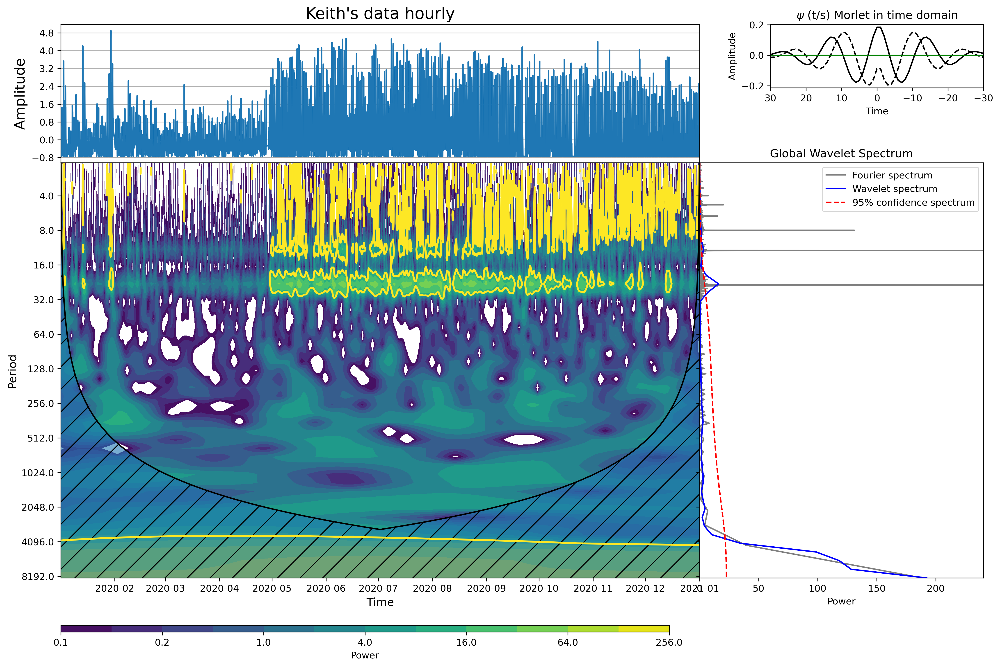

In [124]:
wavelet_compute(result_hourly, 1, name="Keith's data hourly")